### Master project objectives

Main objective: 
- Make a model that automatically segments atg8 spots in cells.

Sub-objectives: 
- Improve the cell segmentation (machine learning vs. tesselation methods).
- Track the cell segmentation decision process with explainable ai methods to potentially learn something about the cell morphology.
- Study the spots of the non-mutants (since there are enough of them to do statistical analyses).

In [1]:
import cv2
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
import tifffile
import plotly.graph_objects as go
import pandas as pd
from segment_anything import SamPredictor, sam_model_registry
import tools


# Define a function to plot contours using cv2.findContours
def plot_contours(image, mask, ax):
    unique_values = np.unique(mask)
    unique_values = unique_values[unique_values != 0]
    print(f"Count unique masks: {len(unique_values)}")

    for mask_value in unique_values:
        binary_mask = np.uint8(mask == mask_value)
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for contour in contours:
            contour = contour.squeeze()
            if contour.ndim == 2:
                ax.plot(contour[:, 0], contour[:, 1], 'r-', linewidth=1)
                
def plot_1018_examples(folder, channel):
    for image_name in os.listdir(folder):
        if image_name.endswith('MaxIP.tif'):
            image_path = os.path.join(folder, image_name)
            print(f"Processing image: {image_name}")
    

            # Loading image
            image = tools.tiff_to_array(image_path)
            image = np.array(image)

            mask_name = image_name[:-4] + '_cp_masks.png'
            mask_path = os.path.join(folder, mask_name)
            
            # Loading mask
            mask = Image.open(mask_path)
            mask = np.array(mask)
    
            # Check dimensions
            if image.shape[1:] != mask.shape:
                print(f"Error: Image dimensions {image.shape[1:]} and mask dimensions {mask.shape} do not match.")
                continue
            fig, axes = plt.subplots(nrows=1, ncols=2, constrained_layout=True, figsize=(12, 6))
            axes[0].imshow(image[channel, :, :], cmap='gray')
            axes[1].imshow(image[channel, :, :], cmap='gray')

            # Plotting contours
            plot_contours(image[channel, :, :], mask, axes[1])
            plt.show() 
            
def plot_544_examples(folder, channel, bright):
    for image_name in os.listdir(folder):
        if image_name.endswith('MaxIP.tif'):
            image_path = os.path.join(folder, image_name)
            print(f"Processing image: {image_name}")
    

            # Loading image
            image = tools.tiff_to_array(image_path)
            image = np.array(image)

            mask_name = image_name[:-4] + '_cp_masks.png'
            mask_path = os.path.join(folder, mask_name)
            
            # Loading mask
            mask = Image.open(mask_path)
            mask = np.array(mask)

            # Check dimensions
            if image.shape[1:] != mask.shape:
                print(f"Error: Image dimensions {image.shape[1:]} and mask dimensions {mask.shape} do not match.")
                continue

            rgb_image = rgb_8bit(image, bright)
            rgb_image_no_green = rgb_8bit_no_green(image, bright)
            
            fig, axes = plt.subplots(nrows=1, ncols=2, constrained_layout=True, figsize=(12, 6))
            axes[0].imshow(rgb_image_no_green)
            axes[1].imshow(rgb_image)

            # Plotting contours
            plot_contours(rgb_image, mask, axes[1])
            plt.show() 


def rgb_8bit(image, bright):
    image_transposed = np.transpose(image, (1, 2, 0))
    red_channel = tools.convert_to_8bit(image_transposed[:,:,2]) * bright
    green_channel = tools.convert_to_8bit(image_transposed[:,:,1])
    blue_channel = tools.convert_to_8bit(image_transposed[:,:,0]) * bright
    rgb_image = np.stack((red_channel, green_channel, blue_channel), axis=-1)
    return rgb_image

def rgb_8bit_no_green(image, bright):
    image_transposed = np.transpose(image, (1, 2, 0))
    red_channel = tools.convert_to_8bit(image_transposed[:,:,2]) *bright
    green_channel = tools.convert_to_8bit(image_transposed[:,:,1])*0
    blue_channel = tools.convert_to_8bit(image_transposed[:,:,0])* bright
    rgb_image = np.stack((red_channel, green_channel, blue_channel), axis=-1)
    return rgb_image
    

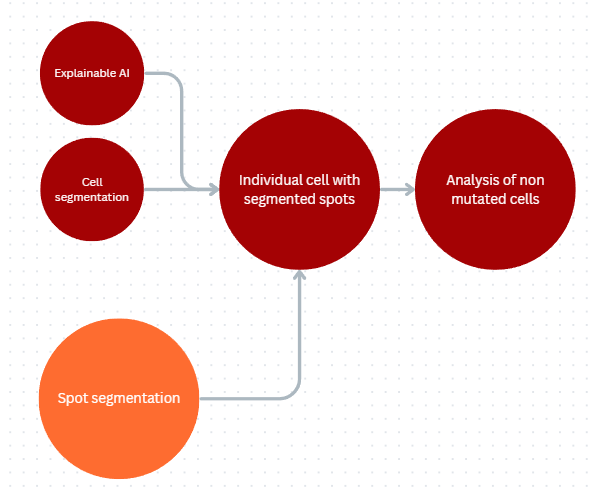

In [2]:


cwd = os.getcwd()
project_map = cwd + '/project_map.png'
img = Image.open(project_map)
img.show()

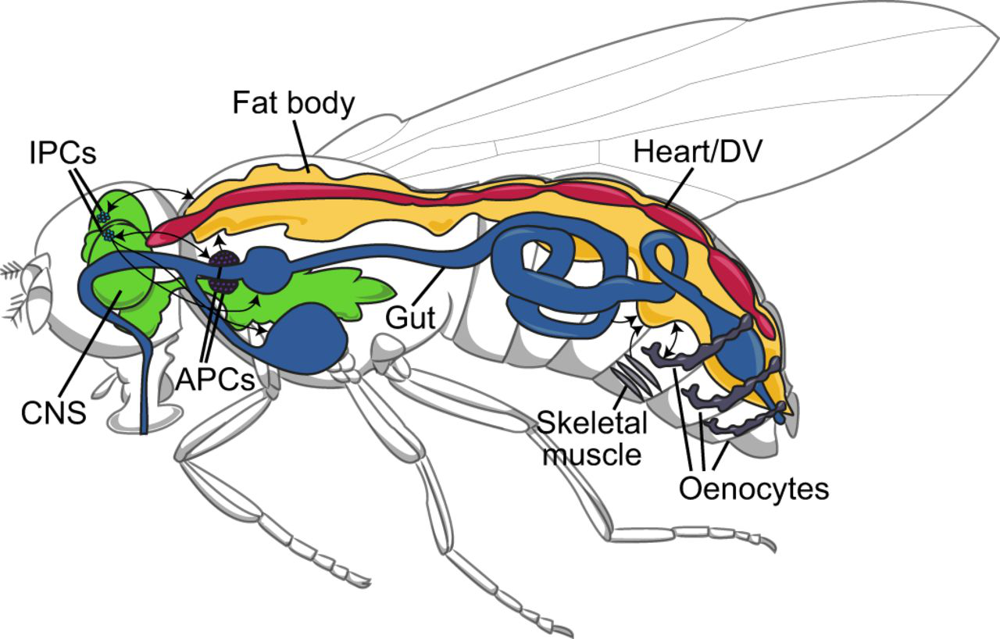

In [96]:
cwd = os.getcwd()
project_map = cwd + '/drosophila_fatbody.jpg'
img = Image.open(project_map)
img.show()



# Cell segmentation

The Cellpose cyto3 model has been tested, starting by creating GT cells with the easily segmentable stained 1018 images and train a model on these, and then moving forward to the non-stained 544 images while continuosly training more an more cells with the human-in-the-loop approach provided by the Cellpose GUI.

Tested:
1. Segmented GT cell masks using the channel with red border staining from the 1018 images.
2. Train the model on the blue Dafi (nuclei) and green GFP (atg8) channel using the GT masks.
3. Test the model on the 544 images, now using the blue Dafi (nuclei) and the red mCherry (atg8) channels.
4. Keep training with a human in the loop strategy.

Problems:
- The cells are overlapping! This is problematic for both cells segmentation and spot segmentation (specially at the border). It is hard to see which cell is on the top..
- The tissue can be torn or stretched in a way that makes it very hard to segment.
- Hard to get good segmentation on all cells in an image.
- Remedy: Since anyway the end goal is to do statistical analysis on seperate cells, getting some few well segmented cell per image should be sufficient. If the bio group wants to have more cells per condition, they probably anyway need to perform more experiments since there are only a few mutated cells per image. 

Reflections:
- Cellpose is designed for cell segmentation, I think we need to make a lot of effort if we want to perform better by starting from scratch.
- Here I spent max 2 hours to make the model in Cellpose, if we want to get better results it is probably possible if we spend more time.
- I would be happy to have some nicely segmented cells for the spot segmentation but I don't want to spend a lot of time clicking in Cellpose. 
- If we don't make our own model I guess the explainable part may fall out.

### Some examples of cell segmentation using tesselation method
- Sometimes doensn't perform so well
- Need the nuclei staining as a point for every cell
- Can machine learning methods work better (without too much manual work in producing GT)?

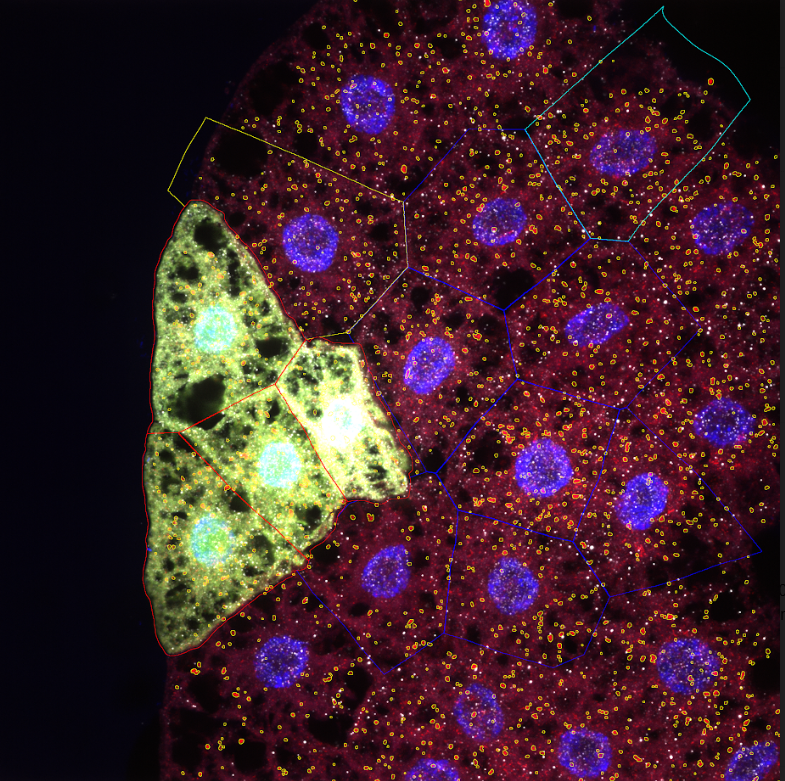

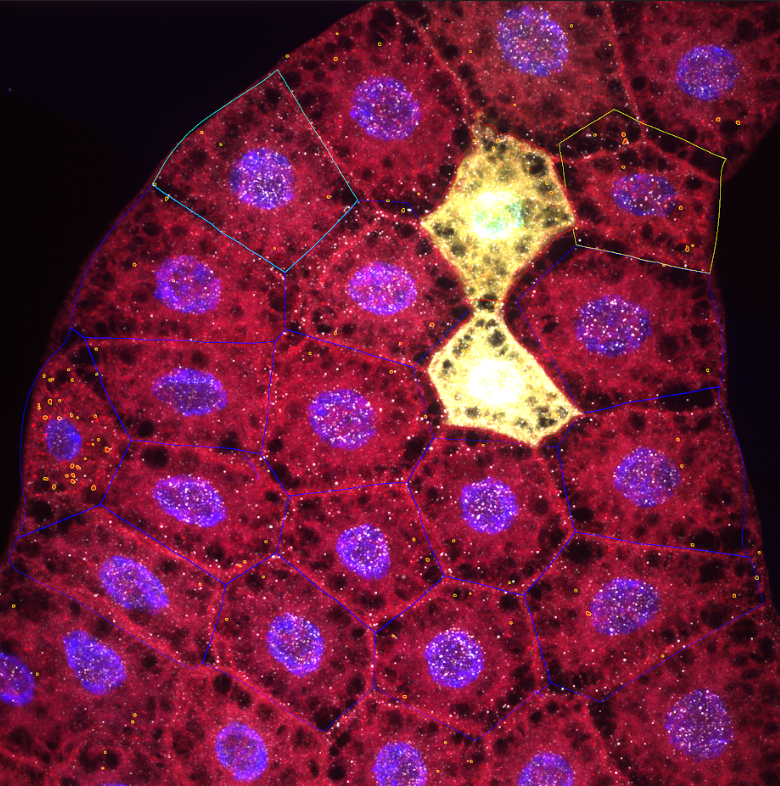

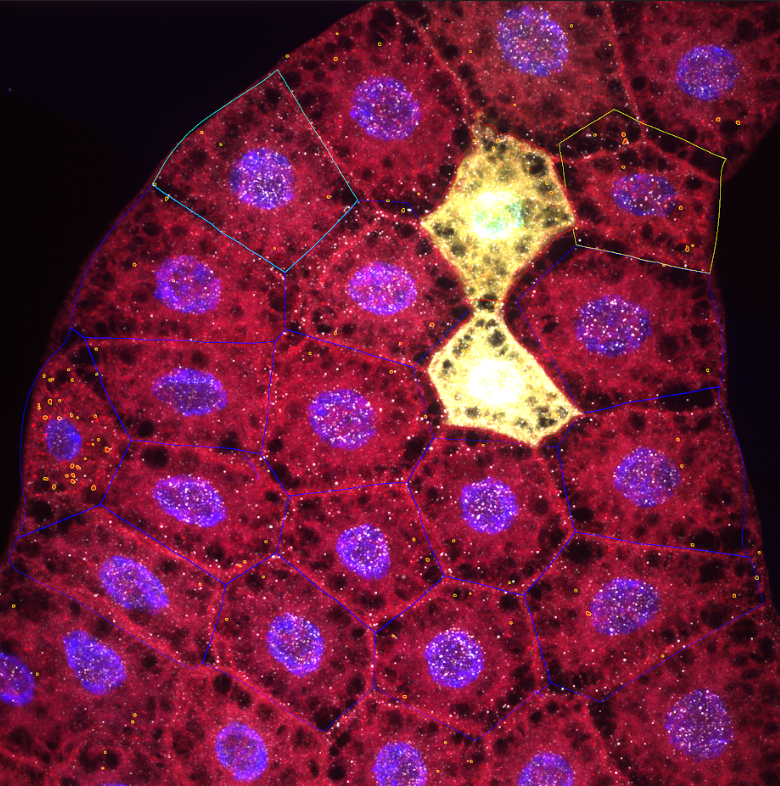

In [3]:
# get example tesselation method

cwd = os.getcwd()
master_folder = os.path.split(cwd)[0]
example_folder = master_folder  + '/cell_segmentation/examples_tesselation/'

image_name = '240506_544_25_F_p4ebp_XY8_MaxIP_small_masks.png'
image_path = example_folder  + image_name
img = Image.open(image_path)
img.show()

image_name = '240506_544_25_F_p4ebp_XY3_MaxIP_masks.png'
image_path = example_folder  + image_name
img = Image.open(image_path)
img.show()

path = '240506_544_25_F_p4ebp_XY9_MaxIP_masks.png'
image_path = example_folder  + image_name
img = Image.open(image_path)
img.show()

### Testing Cellpose
- First we try using Cellpose
- Why did they compute spatial gradients instead of using pixel values when creating the GT?
- Is this something we could try in spot segmentation as well?

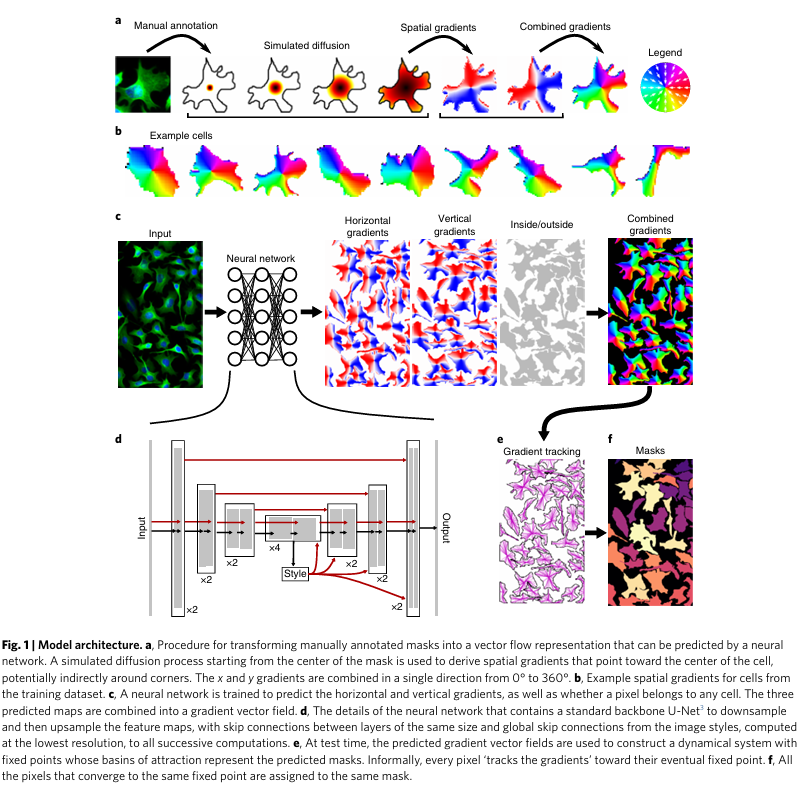

In [4]:
cwd = os.getcwd()
image_name = '/cellpose.png'
image_path = cwd  + image_name
img = Image.open(image_path)
img.show()

### Making GT masks from cells with stained cell borders
- The cyto3 model was used to segment cells using the channel with myr-RFP expressing membrane (what protein is is attached to?).
- Expected cell size was tuned when appropriate
- Bad segmentations were removed.
- Most cells were nicely segmented on first try, otherwise they were discarded

### Training custom model
- A custom model was trained on the blue Dafi (nuclei) and green GFP (atg8) channel once enough GT cells had been segmented.
- Quite some borders are messy, is this due to overlapping cells?

Processing image: 220718_1018_Luc_R1h_XY5_MaxIP.tif
Count unique masks: 18


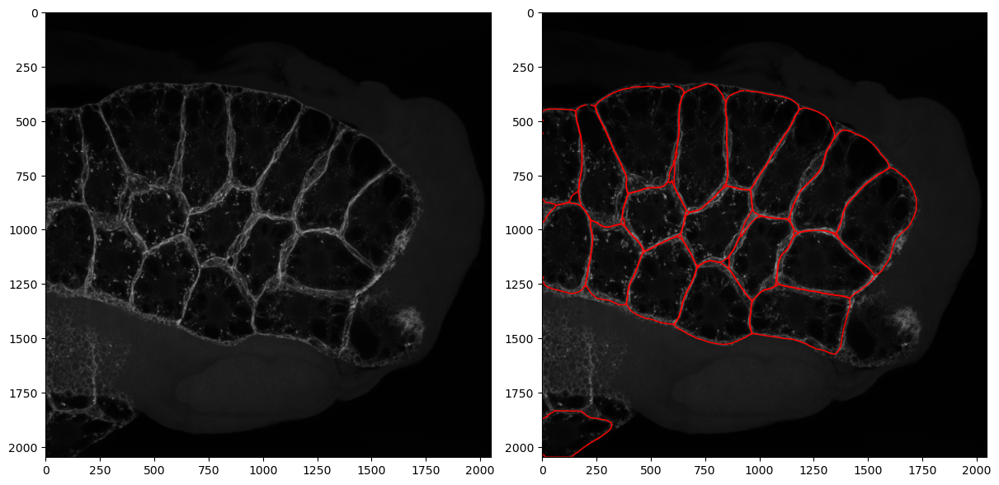

Processing image: 220718_1018_Luc_R2h_XY2_MaxIP.tif
Count unique masks: 32


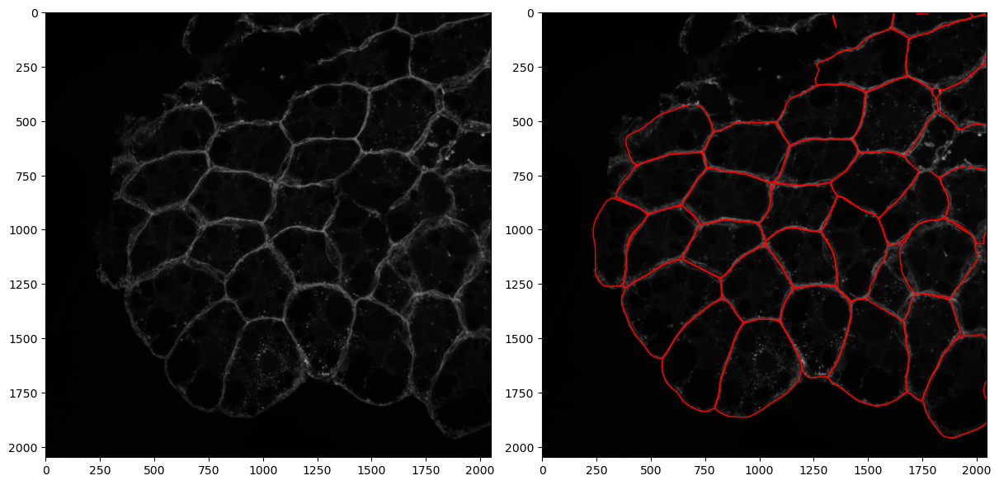

Processing image: 220718_1018_Luc_R2h_XY4_MaxIP.tif
Count unique masks: 34


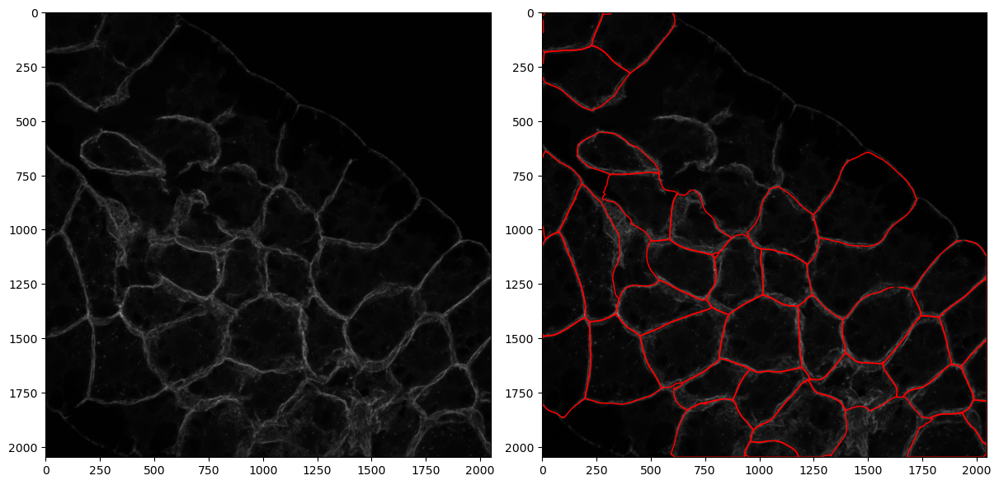

Processing image: 220718_1018_Luc_S4h_XY5_MaxIP.tif
Count unique masks: 35


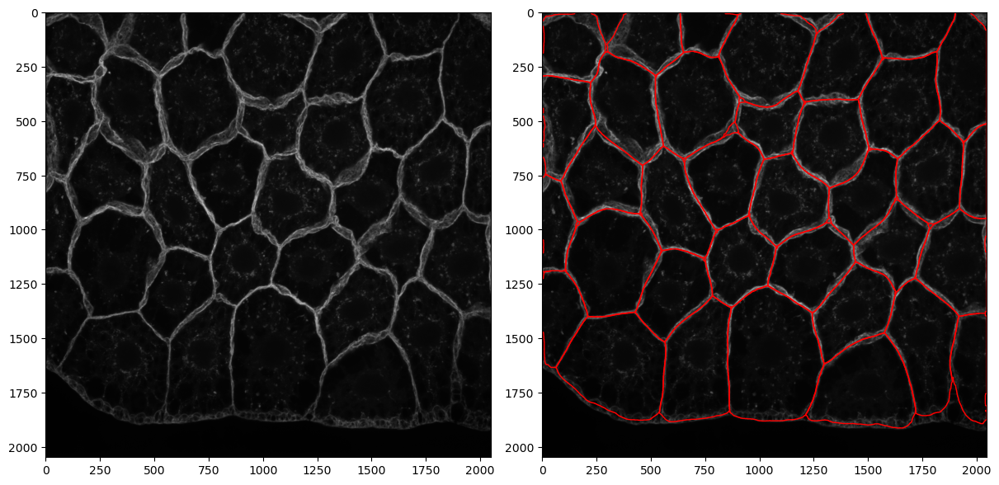

Processing image: 220718_1018_Sun0025_S4h_XY5_MaxIP.tif
Count unique masks: 23


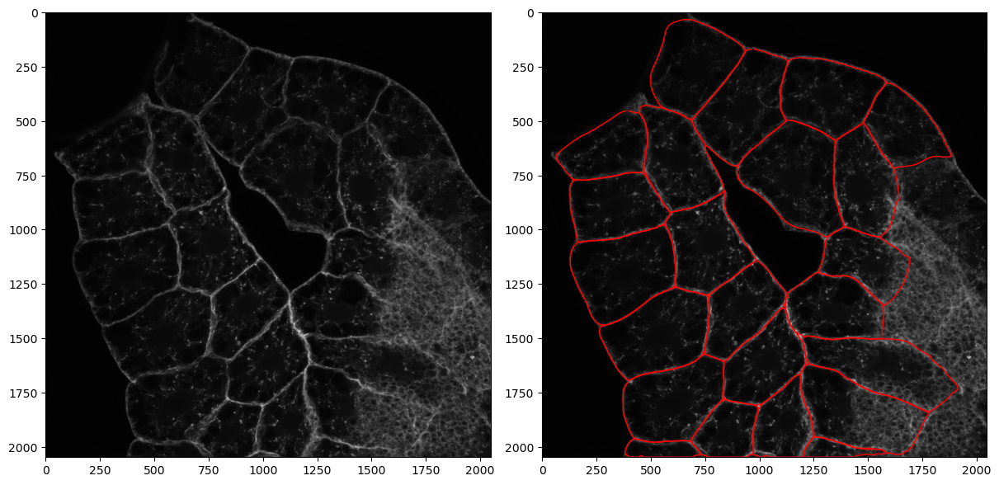

In [93]:
# Get example image with only one mutant cell
cwd = os.getcwd()
folder_1018 = os.path.join(cwd, 'cellpose', 'segmented_1018_270924')
plot_1018_examples(folder_1018, channel=2)

### Testing on 544 cells
- The model was tested on the 544 cells.
- Hard to see how well the model performs, except of on green cells that are clearly distinguishable.
- At first look it is not very good, but then check out the cells, they are overlapping! So perhaps the masks do follow a border, just not the one of the mutated cell.
- The model can be continuosly trained to perform better if it is possible to see how well the segmentation fits (for instance in images with well defined borders in far-red channel).

Processing image: 240506_544_25_F_ampk_XY4_MaxIP.tif
Count unique masks: 28


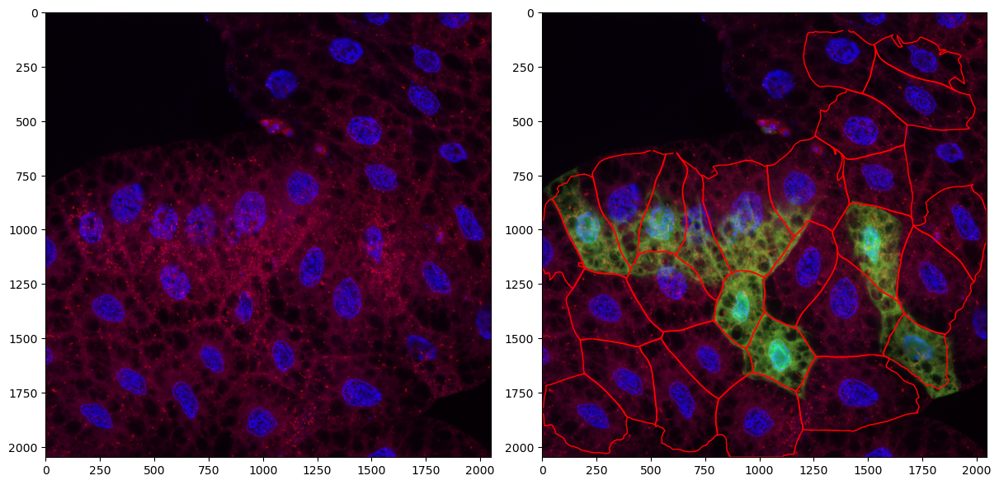

Processing image: 240506_544_25_F_p4ebp_XY5_MaxIP.tif
Count unique masks: 22


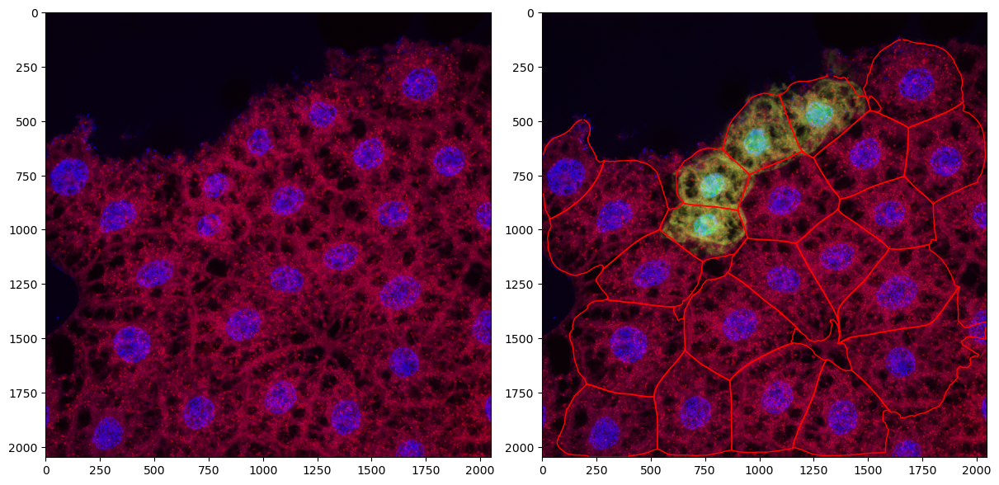

Processing image: 240506_544_25_F_p4ebp_XY6_MaxIP.tif
Count unique masks: 36


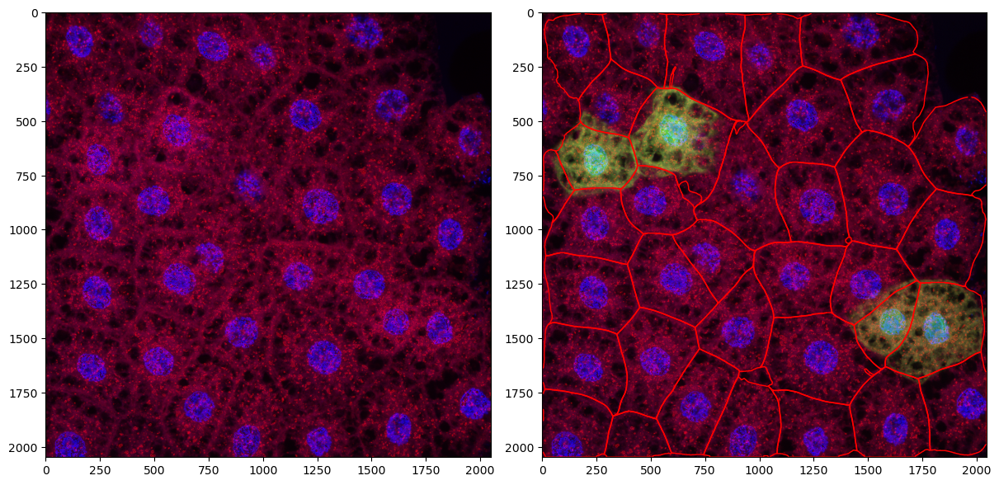

In [4]:
# Get example image with only one mutant cell
cwd = os.getcwd()
folder_544 = os.path.join(cwd, 'cellpose', 'segmented_544_270924')
plot_544_examples(folder_544, channel=3, bright = 5)